In [16]:
import os
import sys
from contextlib import contextmanager, redirect_stdout
from typing import Generator, Literal, cast

import matplotlib.pyplot as plt
import numpy as np
import simpy
from matplotlib.axes import Axes
from matplotlib.figure import Figure

RNG = np.random.default_rng(seed=0)


@contextmanager
def suppress_print():
    """Temporarily disable print statements."""
    with redirect_stdout(open(os.devnull, "w")):
        yield


In [25]:
class SuccessiveClosedNet:
    def __init__(self, lambda_s_cpu: float, lambda_s_disk_fast: float, lambda_s_disk_slow: float, lambda_s_rest: float) -> None:
        self.env = simpy.Environment()
        self.beta_s_cpu = 1. / lambda_s_cpu
        self.beta_s_disk_fast = 1. / lambda_s_disk_fast
        self.beta_s_disk_slow = 1. / lambda_s_disk_slow
        self.beta_s_rest = 1. / lambda_s_rest
        self.cpu = simpy.Resource(self.env, capacity=1)
        self.disk_fast = simpy.Resource(self.env, capacity=1)
        self.disk_slow = simpy.Resource(self.env, capacity=1)
        self.n_jobs = 0

    def cpu_disks_generator(self, job_id: int) -> Generator:
        job_iter = 1

        while True:
            with self.cpu.request() as request:
                print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} waiting for CPU")
                yield request
                start_cpu = self.env.now
                print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} starts using CPU")
                yield self.env.timeout(RNG.exponential(scale=self.beta_s_cpu))
                print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} finished using CPU after {self.env.now - start_cpu:.4f}")
            if np.random.random() > 1/11:
            # speed = RNG.choice(["fast", "slow"])
            # if speed == "fast":
                speed = "fast"
                disk = self.disk_fast
                beta_s_disk = self.beta_s_disk_fast
            else:
                speed = "slow"
                disk = self.disk_slow
                beta_s_disk = self.beta_s_disk_slow
            with disk.request() as request:
                print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} waiting for disk {speed}")
                yield request
                start_disk = self.env.now
                print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} starts using disk {speed}")
                yield self.env.timeout(RNG.exponential(scale=beta_s_disk))
                print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} finished using disk {speed} after {self.env.now - start_disk:.4f}")
            
            # rest
            start_rest = self.env.now
            print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} resting")
            yield self.env.timeout(RNG.exponential(scale=self.beta_s_rest))
            print(f"Time {self.env.now:.4f}:\tjob id {job_id} iter {job_iter} finished resting: {self.env.now - start_rest:.4f}")

            job_iter += 1
            self.n_jobs += 1

    def run(self, n: int, t: float) -> None:
        for _k in range(n):
            self.env.process(self.cpu_disks_generator(_k))
        self.env.run(t)

    def system_throughput(self) -> float:
        return self.n_jobs / self.env.now

In [26]:
cycle_job = 3000
cycle_disk_fast = 1000
cycle_disk_slow = 100


successive_lambda_s_cpu = 1/2 #2sec avg
successive_lambda_s_disk_fast = cycle_disk_fast / cycle_job #1/3 3 sec avg
successive_lambda_s_disk_slow = cycle_disk_slow / cycle_job # 1/30 30 sec avg
successive_lambda_s_rest = 1/15 #15 sec avg

successive_closed_net = SuccessiveClosedNet(successive_lambda_s_cpu, successive_lambda_s_disk_fast, successive_lambda_s_disk_slow, successive_lambda_s_rest)
successive_closed_net.run(40, 100_000)
print(successive_closed_net.system_throughput())

Time 0.0000:	job id 0 iter 1 waiting for CPU
Time 0.0000:	job id 1 iter 1 waiting for CPU
Time 0.0000:	job id 2 iter 1 waiting for CPU
Time 0.0000:	job id 3 iter 1 waiting for CPU
Time 0.0000:	job id 4 iter 1 waiting for CPU
Time 0.0000:	job id 5 iter 1 waiting for CPU
Time 0.0000:	job id 6 iter 1 waiting for CPU
Time 0.0000:	job id 7 iter 1 waiting for CPU
Time 0.0000:	job id 8 iter 1 waiting for CPU
Time 0.0000:	job id 9 iter 1 waiting for CPU
Time 0.0000:	job id 10 iter 1 waiting for CPU
Time 0.0000:	job id 11 iter 1 waiting for CPU
Time 0.0000:	job id 12 iter 1 waiting for CPU
Time 0.0000:	job id 13 iter 1 waiting for CPU
Time 0.0000:	job id 14 iter 1 waiting for CPU
Time 0.0000:	job id 15 iter 1 waiting for CPU
Time 0.0000:	job id 16 iter 1 waiting for CPU
Time 0.0000:	job id 17 iter 1 waiting for CPU
Time 0.0000:	job id 18 iter 1 waiting for CPU
Time 0.0000:	job id 19 iter 1 waiting for CPU
Time 0.0000:	job id 20 iter 1 waiting for CPU
Time 0.0000:	job id 21 iter 1 waiting for CP

In [22]:
def plot_system_throughput(sim_lengths: list[int], n_repetitions: int) -> Figure:
    throughputs = np.empty((len(sim_lengths), n_repetitions))

    for i, length in enumerate(sim_lengths):
        for j in range(n_repetitions):
            net = SuccessiveClosedNet(
                successive_lambda_s_cpu, successive_lambda_s_disk_fast, successive_lambda_s_disk_slow, successive_lambda_s_rest)
            net.run(40, length)
            throughputs[i][j] = net.system_throughput()

    ax: Axes
    fig, ax = plt.subplots()
    ax.set_xlabel("Simulation length")
    ax.set_ylabel("System throughput")
    sim_length_strs = [str(length) for length in sim_lengths]
    mean_throughputs = throughputs.mean(axis=-1)
    ax.bar(
        x=sim_length_strs,
        height=mean_throughputs)
    ax.errorbar(
        x=sim_length_strs, y=mean_throughputs,
        yerr=[
            mean_throughputs - throughputs.min(axis=-1),
            throughputs.max(axis=-1) - mean_throughputs],
        fmt='o', color='k')

    return fig

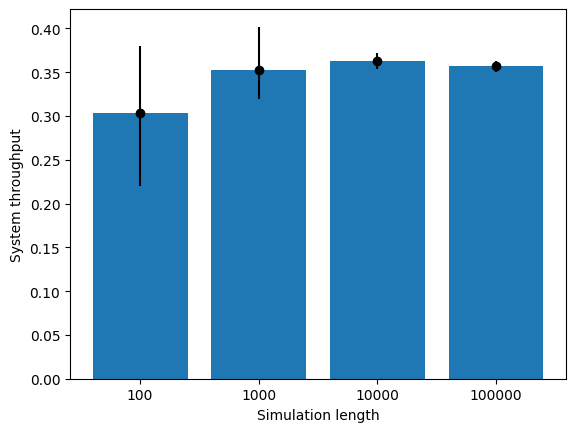

In [23]:
with suppress_print():
    plot_system_throughput([100, 1_000, 10_000, 100_000], 5)

In [ ]:
# 1/2 -- 1/3 + 1/30 -- 15s delay

In [26]:
class OpenNet:
    def __init__(self,lambda_i:float, lambda_s_cpu: float, lambda_s_disk_fast: float, lambda_s_disk_slow: float) -> None:
        self.env = simpy.Environment()
        self.beta_i = 1. / lambda_i
        self.beta_s_cpu = 1. / lambda_s_cpu
        self.beta_s_disk_fast = 1. / lambda_s_disk_fast
        self.beta_s_disk_slow = 1. / lambda_s_disk_slow
        self.cpu = simpy.Resource(self.env, capacity=1)
        self.disk_fast = simpy.Resource(self.env, capacity=1)
        self.disk_slow = simpy.Resource(self.env, capacity=1)

        self.n_curr_jobs_in_sys = 0
        self.log_jobs_in_sys: list[int] = []

        self.e_t_acc = 0.
        self.n_served_jobs = 0
        self.rho_cpu_acc = 0
        self.rho_disk_fast_acc = 0
        self.rho_disk_slow_acc = 0
        self.rho_sys_acc = 0

    def cpu_disks_generator(self, job_id: int) -> Generator:
        job_start_time = self.env.now

        rho_cpu = self.cpu.count / self.cpu.capacity

        if np.random.random() > 9/21:
            speed = "fast"
            disk = self.disk_fast
            beta_s_disk = self.beta_s_disk_fast
            rho_disk = self.disk_fast.count / self.disk_fast.capacity
            self.rho_disk_fast_acc += rho_disk
        else:
            speed = "slow"
            disk = self.disk_slow
            beta_s_disk = self.beta_s_disk_slow
            rho_disk = self.disk_slow.count / self.disk_slow.capacity
            self.rho_disk_slow_acc += rho_disk

        self.rho_cpu_acc += rho_cpu
        
        self.rho_sys_acc += rho_cpu or rho_disk

        self.log_jobs_in_sys.append(self.n_curr_jobs_in_sys)
        self.n_curr_jobs_in_sys += 1

        with self.cpu.request() as request:
            # print(f"Time {self.env.now:.4f}:\tjob id {job_id} waiting for CPU")
            yield request
            # start_cpu = self.env.now
            # print(f"Time {self.env.now:.4f}:\tjob id {job_id} starts using CPU")
            yield self.env.timeout(RNG.exponential(scale=self.beta_s_cpu))
            # print(f"Time {self.env.now:.4f}:\tjob id {job_id} finished using CPU after {self.env.now - start_cpu:.4f}")
        
        with disk.request() as request:
            # print(f"Time {self.env.now:.4f}:\tjob id {job_id} waiting for disk {speed}")
            yield request
            # start_disk = self.env.now
            # print(f"Time {self.env.now:.4f}:\tjob id {job_id} starts using disk {speed}")
            yield self.env.timeout(RNG.exponential(scale=beta_s_disk))
            # print(f"Time {self.env.now:.4f}:\tjob id {job_id} finished using disk {speed} after {self.env.now - start_disk:.4f}")
        
        self.n_curr_jobs_in_sys -= 1

        self.e_t_acc += self.env.now - job_start_time
        self.n_served_jobs += 1

    def jobs_generator(self) -> Generator:
        while True:
            yield self.env.timeout(RNG.exponential(self.beta_i))
            self.env.process(self.cpu_disks_generator(self.n_served_jobs))

    def run(self, t: float) -> "OpenNet":
      self.env.process(self.jobs_generator())
      self.env.run(until=t)

      return self

    def expected_response_time(self) -> float:
        return self.e_t_acc / self.n_served_jobs
    
    def expected_jobs_in_system(self) -> float:
        return sum(self.log_jobs_in_sys) / len(self.log_jobs_in_sys)
    
    def utilization(self, component: Literal["cpu", "disk_fast", "disk_slow", "sys"]) -> float:
        rho_acc = {
            "cpu": self.rho_cpu_acc,
            "disk_fast": self.rho_disk_fast_acc,
            "disk_slow": self.rho_disk_slow_acc,
            "sys": self.rho_sys_acc
        }[component]

        return rho_acc / len(self.log_jobs_in_sys)


    def system_throughput(self) -> float:
        return self.n_served_jobs / self.env.now

In [ ]:
open_lambda_s_cpu = 10 #0.1sec avg
open_lambda_s_disk_fast = 12 #12/sec
open_lambda_s_disk_slow = 9 # 9/sec
print(np.arange(7, 11.5, 0.5))
for open_lambda_i in np.arange(7, 11.5, 0.5):
  open_net = OpenNet(open_lambda_i, open_lambda_s_cpu, open_lambda_s_disk_fast, open_lambda_s_disk_slow)
  open_net.run(50000)
  print(f"lambda: {open_lambda_i}, throughput: {open_net.system_throughput():.4f}, rho_cpu: {open_net.utilization("cpu"):.4f}, rho_disk_fast: {open_net.utilization("disk_fast"):.4f}, rho_disk_slow: {open_net.utilization("disk_slow"):.4f}, rho_sys: {open_net.utilization("sys"):.4f}")
  # print(f"lambda: {open_lambda_i}, X: {open_net.system_throughput()}, rho_cpu: {open_net.rho_cpu_acc}, rho_disk_fast: {open_net.rho_disk_fast_acc}, rho_disk_slow: {open_net.rho_disk_slow_acc}, rho_sys: {open_net.rho_sys_acc}")
  # print()

[ 7.   7.5  8.   8.5  9.   9.5 10.  10.5 11. ]
lambda: 7.0, throughput: 6.9992, rho_cpu: 0.6987, rho_disk_fast: 0.1899, rho_disk_slow: 0.1437, rho_sys: 0.7997
lambda: 7.5, throughput: 7.5253, rho_cpu: 0.7539, rho_disk_fast: 0.2064, rho_disk_slow: 0.1537, rho_sys: 0.8428
lambda: 8.0, throughput: 8.0015, rho_cpu: 0.7994, rho_disk_fast: 0.2182, rho_disk_slow: 0.1630, rho_sys: 0.8754
lambda: 8.5, throughput: 8.4808, rho_cpu: 0.8478, rho_disk_fast: 0.2301, rho_disk_slow: 0.1731, rho_sys: 0.9096
lambda: 9.0, throughput: 8.9918, rho_cpu: 0.8980, rho_disk_fast: 0.2453, rho_disk_slow: 0.1831, rho_sys: 0.9421
lambda: 9.5, throughput: 9.4952, rho_cpu: 0.9478, rho_disk_fast: 0.2585, rho_disk_slow: 0.1940, rho_sys: 0.9715
lambda: 10.0, throughput: 9.9956, rho_cpu: 1.0000, rho_disk_fast: 0.2714, rho_disk_slow: 0.2042, rho_sys: 1.0000
lambda: 10.5, throughput: 9.9940, rho_cpu: 1.0000, rho_disk_fast: 0.2704, rho_disk_slow: 0.2042, rho_sys: 1.0000
lambda: 11.0, throughput: 10.0051, rho_cpu: 1.0000, rho